In [3]:
# This Python 3 environment comes with many helpful analytics libraries installed
# It is defined by the kaggle/python Docker image: https://github.com/kaggle/docker-python
# For example, here's several helpful packages to load

import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)

# Input data files are available in the read-only "../input/" directory
# For example, running this (by clicking run or pressing Shift+Enter) will list all files under the input directory

import os
for dirname, _, filenames in os.walk('/kaggle/input'):
    for filename in filenames:
        print(os.path.join(dirname, filename))

# You can write up to 20GB to the current directory (/kaggle/working/) that gets preserved as output when you create a version using "Save & Run All" 
# You can also write temporary files to /kaggle/temp/, but they won't be saved outside of the current session

/kaggle/input/tabular-playground-series-jun-2021/sample_submission.csv
/kaggle/input/tabular-playground-series-jun-2021/train.csv
/kaggle/input/tabular-playground-series-jun-2021/test.csv


In [2]:
import seaborn as sns
import matplotlib.pyplot as plt
import plotly_express as px

In [4]:
train = pd.read_csv('../input/tabular-playground-series-jun-2021/train.csv')
test = pd.read_csv('../input/tabular-playground-series-jun-2021/test.csv')
train

,id,feature_0,feature_1,feature_2,feature_3,feature_4,feature_5,feature_6,feature_7,feature_8,...,feature_66,feature_67,feature_68,feature_69,feature_70,feature_71,feature_72,feature_73,feature_74,target
0,0,0,0,6,1,0,0,0,0,7,...,0,0,0,0,0,0,2,0,0,Class_6
1,1,0,0,0,0,0,0,0,0,0,...,2,0,0,0,0,0,0,1,0,Class_6
2,2,0,0,0,0,0,1,0,3,0,...,0,0,0,0,1,0,0,0,0,Class_2
3,3,0,0,7,0,1,5,2,2,0,...,0,4,0,2,2,0,4,3,0,Class_8
4,4,1,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,Class_2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
199995,199995,0,1,6,0,1,32,0,6,0,...,0,1,1,0,0,0,4,1,0,Class_6
199996,199996,0,2,0,0,1,0,0,0,0,...,0,0,0,0,0,0,0,0,0,Class_6
199997,199997,1,2,0,0,0,2,0,1,8,...,1,0,1,1,1,0,1,0,0,Class_8
199998,199998,0,0,2,0,2,1,0,0,3,...,0,0,3,2,1,0,0,1,0,Class_7


In [5]:
train.target.unique()

array(['Class_6', 'Class_2', 'Class_8', 'Class_3', 'Class_1', 'Class_5',
       'Class_7', 'Class_9', 'Class_4'], dtype=object)

In [6]:
train.target.value_counts()

Class_6    51811
Class_8    51763
Class_9    25542
Class_2    24431
Class_3    14798
Class_7    14769
Class_1     9118
Class_4     4704
Class_5     3064
Name: target, dtype: int64

In [8]:
fig = px.histogram(train,'target', histnorm='percent')
fig.show()
#histnorm gives the format of y. By default it gives the count of value occurences of x variable

In [9]:
fig = px.pie(train,values='feature_48',names='target',title='Class Distribution')
fig.update_traces(textposition='inside', textinfo='percent+label')
fig.show()
#In px.pie, data visualized by the sectors of the pie is set in values. The sector labels are set in names.

Class_6 and Class 8 alone rakes up >50% of the samples. While Class_5 and Class_4 have very less representation

In [10]:
fig = px.scatter(train, x = 'feature_0', y= 'feature_7', 
                 hover_name='target', color='target')
fig.show()
#hovername gives the value of the point as we move our cursor over the plot

# Correlation Plot

<AxesSubplot:>

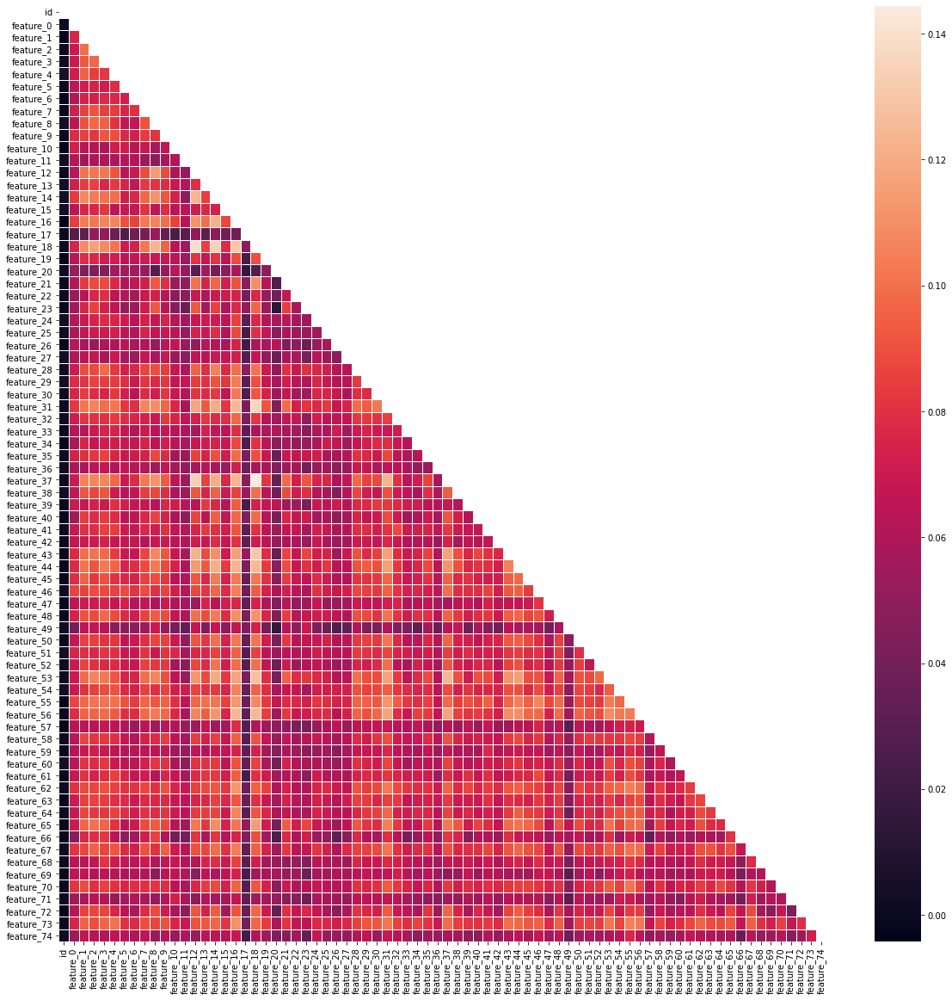

In [11]:
corr_mat = train.corr()
mask = np.zeros_like(corr_mat)
mask[np.triu_indices_from(mask)] = True

plt.figure(figsize=(20,20))
sns.heatmap(corr_mat, annot=False, mask=mask,
           linewidths=.5)

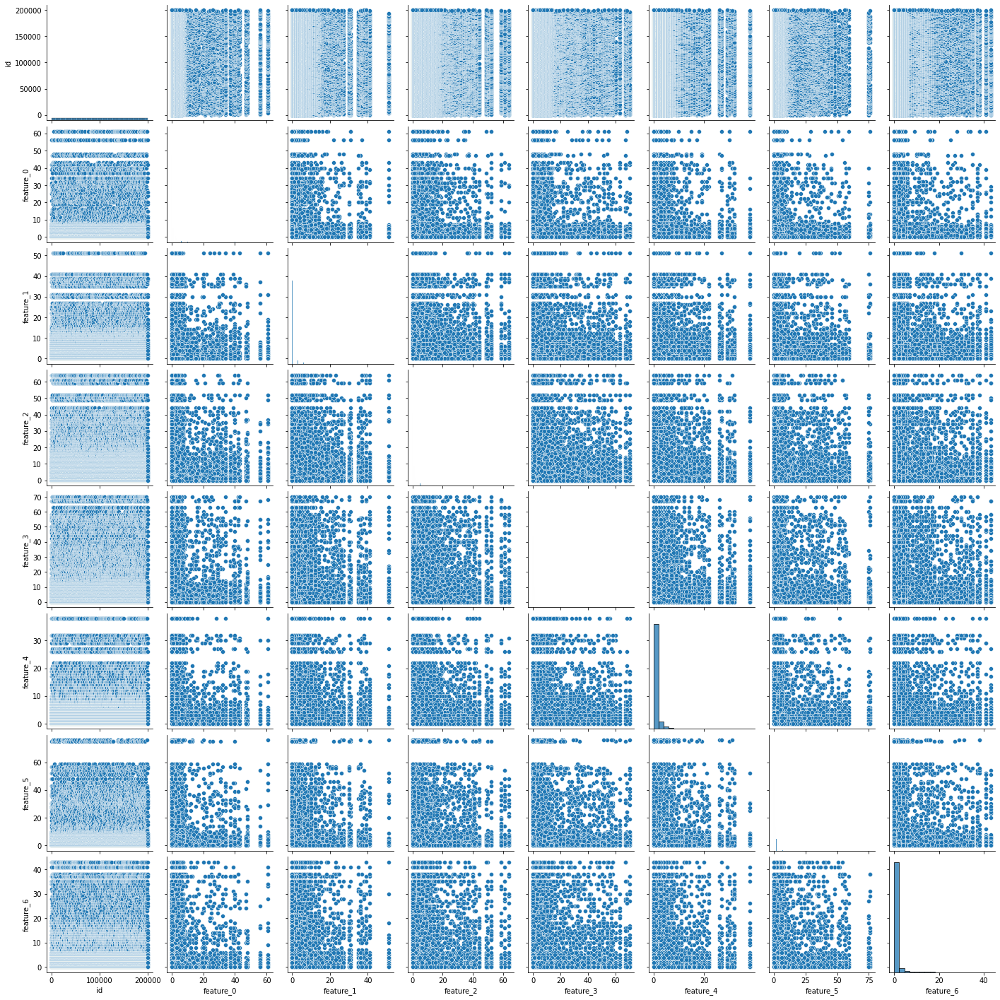

In [12]:
some_columns = train.columns[:8]
sns.pairplot(data=train[some_columns], kind='scatter')

In [13]:
train.drop(columns='id',inplace=True)  #not required

In [14]:
train.describe()

,feature_0,feature_1,feature_2,feature_3,feature_4,feature_5,feature_6,feature_7,feature_8,feature_9,...,feature_65,feature_66,feature_67,feature_68,feature_69,feature_70,feature_71,feature_72,feature_73,feature_74
count,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.00000,200000.000000,...,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.00000,200000.000000
mean,0.972710,1.168365,2.219325,2.296735,0.793530,1.431105,1.010695,0.673090,1.94398,1.719655,...,1.798040,0.508695,1.827300,0.910370,1.603585,1.219210,0.806895,1.282925,2.94021,0.632005
std,3.941836,3.993407,6.476570,7.551858,2.935785,5.162746,3.949231,2.234949,3.93133,5.916988,...,5.053014,1.867330,7.188924,3.835182,4.877679,4.826003,2.458741,4.261420,10.78465,3.925310
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.00000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.00000,0.000000
25%,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.00000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.00000,0.000000
50%,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.00000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.00000,0.000000
75%,1.000000,1.000000,1.000000,1.000000,0.000000,1.000000,0.000000,0.000000,2.00000,1.000000,...,1.000000,0.000000,1.000000,1.000000,2.000000,1.000000,1.000000,1.000000,1.00000,0.000000
max,61.000000,51.000000,64.000000,70.000000,38.000000,76.000000,43.000000,30.000000,38.00000,72.000000,...,54.000000,24.000000,79.000000,55.000000,65.000000,67.000000,30.000000,61.000000,130.00000,52.000000


In [15]:
px.scatter(train.describe().T, x='mean', y= 'max', size='std',
          hover_name='std', title='Describe Plot')

We see that mean and max are mostly positively correlated, except for a few features. Also, in general std dev is high for higher mean and max values.

# Unique Counts of each Feature

<StemContainer object of 3 artists>

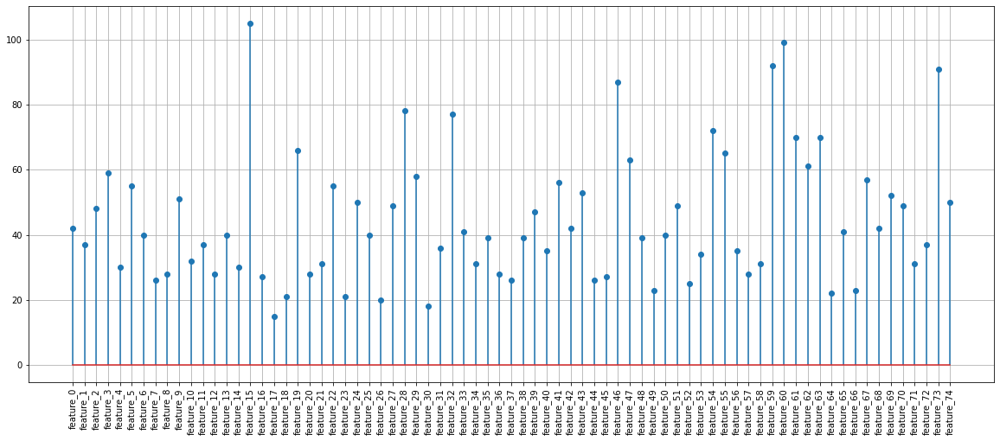

In [17]:
feat_unique_counts= np.zeros(len(train.columns[:-1]))
c=0
for i in train.columns[:-1]:
    feat_unique_counts[c]= train[i].nunique()
    c+=1

plt.figure(figsize=(20,8))
plt.grid()
plt.xticks(rotation=90)
plt.stem(train.columns[:-1],feat_unique_counts)

It's hard to distinguish numerical and categorical values as there are no binary/trinary features

# Encoding the Classes

In [18]:
enc = {
    'Class_1':0.0,
    'Class_2':1.0,
    'Class_3':2.0,
    'Class_4':3.0,
    'Class_5':4.0,
    'Class_6':5.0,
    'Class_7':6.0,
    'Class_8':7.0,
    'Class_9':8.0    
}

train.target.replace(to_replace=enc,inplace=True)
train.target

0         5.0
1         5.0
2         1.0
3         7.0
4         1.0
         ... 
199995    5.0
199996    5.0
199997    7.0
199998    6.0
199999    7.0
Name: target, Length: 200000, dtype: float64

In [19]:
X = train.drop(columns='target').to_numpy()
y = train.target.to_numpy()
test = test.drop(columns='id').to_numpy()

X.shape,test.shape

((200000, 75), (100000, 75))